<a href="https://www.kaggle.com/code/subhadipde2000/wastenet?scriptVersionId=244342199" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Introduction <a id="introduction"></a>:

In the realm of environmental sustainability, waste management is a critical challenge that necessitates innovative solutions. One of the key aspects of effective waste management is the accurate classification of different types of waste. This classification enables efficient recycling, disposal, and resource recovery processes. Traditional methods of waste classification often rely on manual sorting, which is labor-intensive and prone to human error.

To address these issues, this project aims to leverage the power of computer vision and deep learning to develop an automated waste classification system. The dataset consists of 15,000 images from 30 different waste categories. Within each waste category, there are two sub-folders:

1. `default`: This folder contains standard or studio-like images of the waste item. These images provide a clear and controlled representation of the item, which can be useful for initial training and testing of waste classification models.

2. `real_world`: This folder contains images of the waste item in real-world scenarios or environments. These images capture the item in various contexts, such as in a trash bin, on the ground, or in a cluttered environment. The real-world images are essential for evaluating the performance and robustness of waste classification models in practical settings.

By utilizing this dataset, we aim to train a robust model capable of accurately identifying various types of waste.

# Problem Statement <a id="problem-statement"></a>:
The goal of this project is to develop an automated waste classification system using state-of-the-art deep learning techniques. The system will classify waste images into predefined categories by fine-tuning an `EfficientNetV2` model. This model will be trained on a dataset of 15,000 images representing various types of waste. The project includes steps such as image preprocessing, augmentation techniques using KerasCV (e.g., `CutMix`, `MixUp`), and model fine-tuning to achieve high accuracy and robust performance. The successful implementation of this system will contribute towards reducing human error in waste sorting, leading to more efficient recycling processes and promoting sustainability.


---

In [1]:
!nvidia-smi

Sun Jun  8 09:12:26 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P0             27W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

---

# Imports <a id="imports"></a>:

In [2]:
import os
import shutil
import keras
import random
import keras_cv
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics import accuracy_score
from keras.utils import image_dataset_from_directory

2025-06-08 09:12:28.770472: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-06-08 09:12:28.770599: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-06-08 09:12:28.899549: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
# Setting up Keras Backend
os.environ["KERAS_BACKEND"] = "jax"

In [4]:
warnings.filterwarnings("ignore")

In [5]:
# Reproducability
tf.keras.utils.set_random_seed(73)

---

# Exploring the Working Directory <a id="exploring-the-working-directory"></a>:

The current structure of the `/kaggle/input/` directory is as follows:

- /kaggle/input/recyclable-and-household-waste-classification/images/images/

  - aerosol_cans/
    - default/
      - image1.png
      - image2.png
      - ...
    - real_world/
      - image1.png
      - image2.png
      - ...
      
      
  - aluminium_food_cans/
    - default/
      - image1.png
      - image2.png
      - ...
    - real_world/
      - image1.png
      - image2.png
      - ...
      
      
  - aluminum_soda_cans/
    - default/
      - image1.png
      - image2.png
      - ...
    - real_world/
      - image1.png
      - image2.png
      - ...
     
     
  - ...

In [6]:
# Creating a list of directories of all image categories in /kaggle/input/

waste_type_dir = []

for (root, dirs, files) in os.walk('/kaggle/input'):
    if root.split('/')[-3:-1] == ['images', 'images']:
        waste_type_dir.append(root)
        
waste_type_dir.sort()
waste_type_dir[:5]

['/kaggle/input/recyclable-and-household-waste-classification/images/images/aerosol_cans',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/aluminum_food_cans',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/aluminum_soda_cans',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/cardboard_boxes',
 '/kaggle/input/recyclable-and-household-waste-classification/images/images/cardboard_packaging']

# Creating Train, Test, and Validation Directories <a id="creating-train-test-and-validation-directories"></a>:

In [7]:
# Defining the paths for training, validation, test directories
train_dir = '/kaggle/working/training-images/'
valid_dir = '/kaggle/working/validation-images/'
test_dir = '/kaggle/working/test-images/'

In [8]:
# Creating the directories for training and test images and also creating sub-directories for each waste category
for x in waste_type_dir:
    os.makedirs(train_dir + x.split('/')[-1], exist_ok=True)
    os.makedirs(valid_dir + x.split('/')[-1], exist_ok=True)
    os.makedirs(test_dir + x.split('/')[-1], exist_ok=True)

---

# EDA <a id="EDA"></a>:

In [9]:
# Creating a dataframe of waste categories and the corressponding number of images in each category

num_images_dict = {'waste_category': [x.split('/')[-1] for x in waste_type_dir],
             'num_images': [(len(os.listdir(x + '/default')) + len(os.listdir(x + '/real_world'))) for x in waste_type_dir],
             'num_default_images': [len(os.listdir(x + '/default')) for x in waste_type_dir],
             'num_real_world_images': [len(os.listdir(x + '/real_world')) for x in waste_type_dir]}

num_images_df = pd.DataFrame.from_dict(num_images_dict)

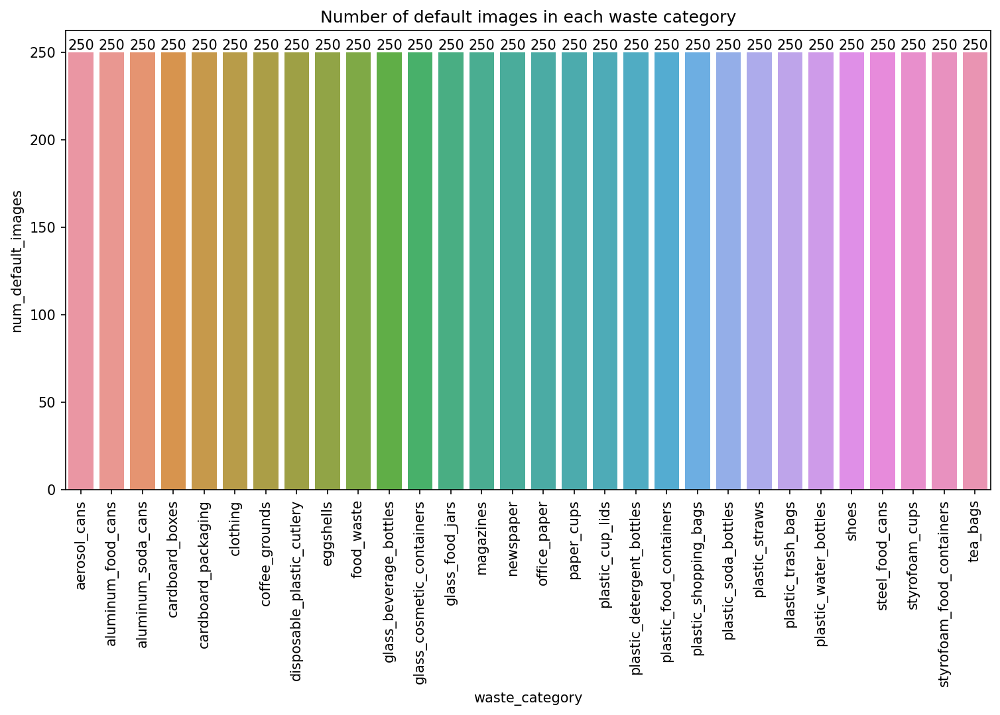

In [10]:
plt.figure(figsize=(12, 6), dpi=150)
plt.title("Number of default images in each waste category")
plt.xticks(rotation=90)
ax = sns.barplot(num_images_df, x='waste_category', y='num_default_images')
ax.bar_label(ax.containers[0], fontsize=10);

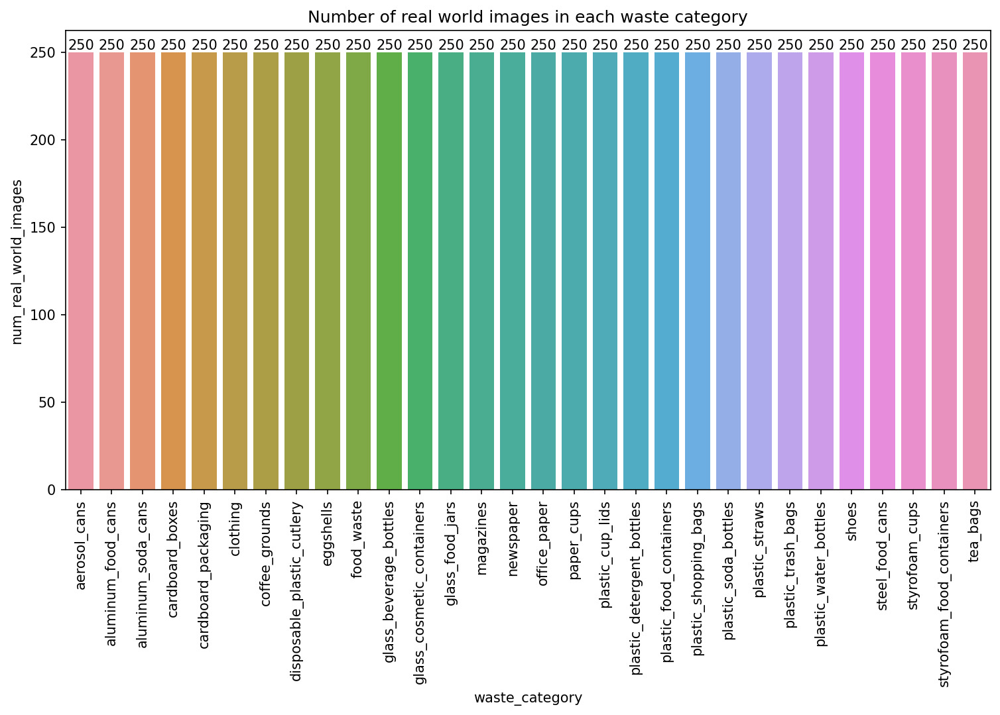

In [11]:
plt.figure(figsize=(12, 6), dpi=150)
plt.title("Number of real world images in each waste category")
plt.xticks(rotation=90)
ax = sns.barplot(num_images_df, x='waste_category', y='num_real_world_images')
ax.bar_label(ax.containers[0], fontsize=10);

* As you can see that, we have a balanced dataset because all the categories have the same number of images.

In [12]:
# Function for plotting 2 random images from a folder

def plot_random_images_from_directory(directory_path):
    
    all_files = os.listdir(directory_path) 
    
    if len(all_files) < 4:
        print("Not enough images in the directory to display.")
        return
    
    selected_images = random.sample(all_files, 2)
    fig, axes = plt.subplots(1, 2, figsize=(6, 3), dpi=100)
    
    for i, ax in enumerate(axes.flat):
        image_path = os.path.join(directory_path, selected_images[i])
        img = mpimg.imread(image_path)
        ax.imshow(img)
        ax.axis('off')
        
    class_name = os.path.basename(directory_path)
    fig.suptitle(directory_path.split('/')[-2] + ': ' + class_name, fontsize=16)
    plt.tight_layout()
    plt.show()

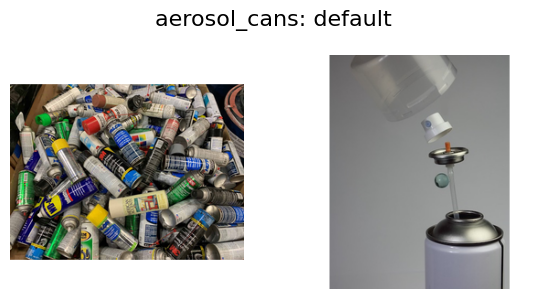

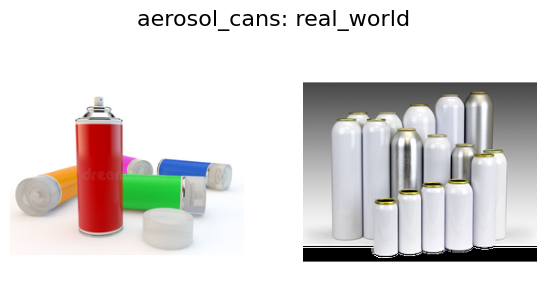

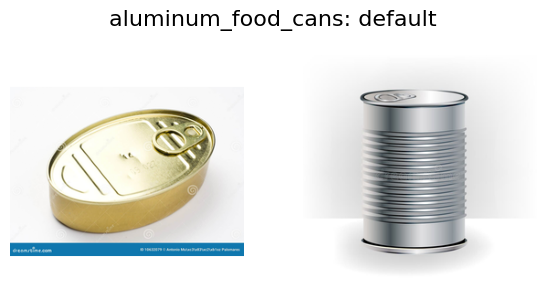

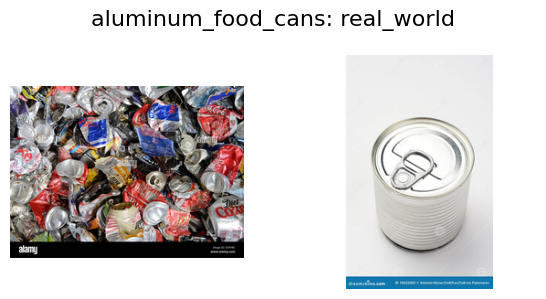

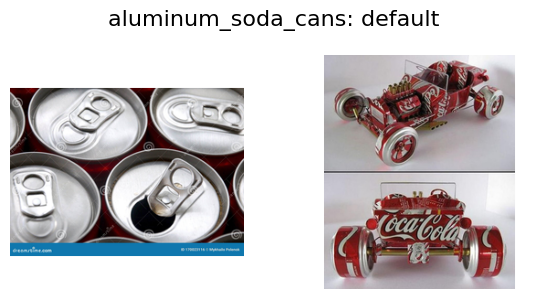

...

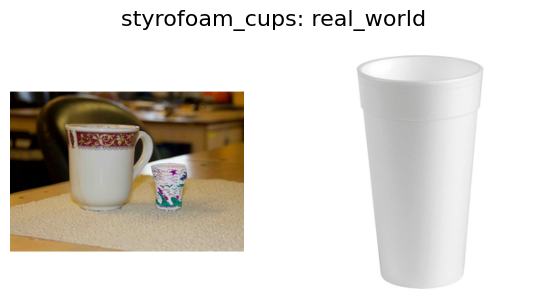

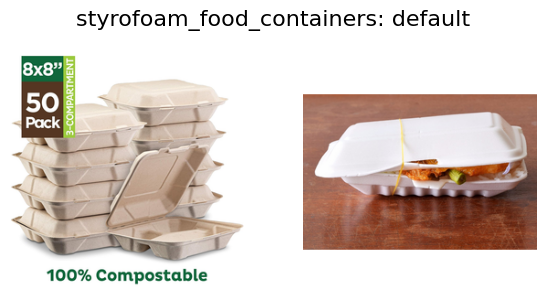

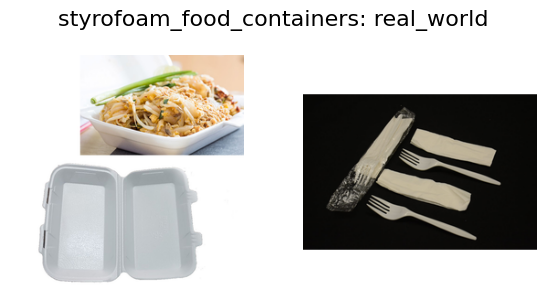

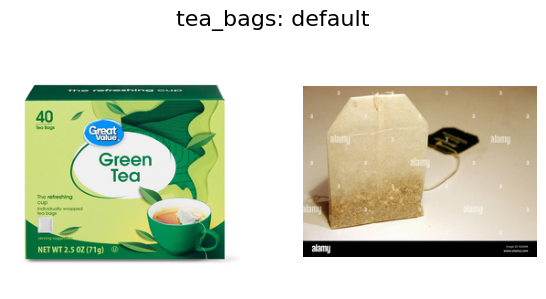

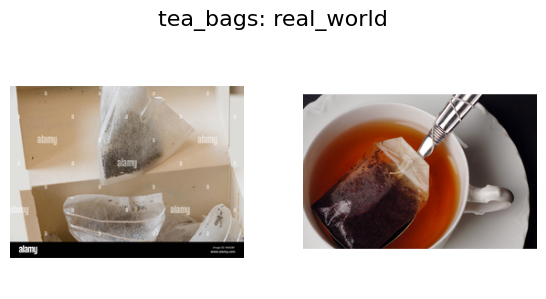

In [13]:
# Visualizing 2 random default and real_world images of every waste category

for directory in waste_type_dir:
    plot_random_images_from_directory(directory + '/default')
    plot_random_images_from_directory(directory + '/real_world')

---

# Copying the Images <a id="copying-the-images"></a>:

The images in `/kaggle/input/` are not seggregated into train, test and validation directories. So, we will first copy all the 15,000 images to `/kaggle/working/training-images` directory. From there, we will move 50 images of each waste category to the `/kaggle/working/validation-images` and `/kaggle/working/test-images`. The final structure of `/kaggle/working/` would look as follows:


- /kaggle/working/


    - training-images/
        - aerosol_cans/
            - image1.png
            - image2.png
            - image3.png
            - ...
        - aluminium_food_cans/
            - image1.png
            - image2.png
            - image3.png
            - ...
        - aluminum_soda_cans/
            - image1.png
            - image2.png
            - image3.png
            - ...
        - ...


    - validation-images/
        - aerosol_cans/
            - image1.png
            - image2.png
            - image3.png
            - ...
        - aluminium_food_cans/
            - image1.png
            - image2.png
            - image3.png
            - ...
        - aluminium_soda_cans/
            - image1.png
            - image2.png
            - image3.png
            - ...
        - ... 
 
 
    - test-images/
        - aerosol_cans/
            - image1.png
            - image2.png
            - image3.png
            - ...
        - aluminium_food_cans/
            - image1.png
            - image2.png
            - image3.png
            - ...
        - aluminium_soda_cans/
            - image1.png
            - image2.png
            - image3.png
            - ...
        - ...

In [14]:
# Creating a list of all image paths in /kaggle/input/

file_paths = []

for directory in waste_type_dir:
    for root, dirs, files in os.walk(directory):
        if root.split('/')[-1] == 'default' or root.split('/')[-1] == 'real_world':
            paths = os.listdir(root)
            for path in paths:
                file_paths.append(os.path.join(root, path))
                
file_paths.sort()

if len(file_paths) == len(set(file_paths)):
    print("There are no duplicate file paths in the list.")
else:
    print(f"There are {len(file_paths)-len(set(file_paths))} duplicate file paths in the list.")

There are no duplicate file paths in the list.


In [15]:
# Copyling all the images to the sub-directories of /kaggle/working/training-images/ according to their waste category

num=0

for src in file_paths:
    fn = src.split('/')[-1]
    dst = train_dir + src.split('/')[-3] + '/'
    if fn not in os.listdir(dst):
        shutil.copy(src, dst)
        num+=1
    elif fn in os.listdir(dst):
        new_fn = 'Image_' + str(250 + int(fn.split('_')[-1].split('.')[0])) + '.png'
        shutil.copy(src, dst + new_fn)
        num+=1

print(f"Fininshed copying {num} images.")

Fininshed copying 15000 images.


In [16]:
# Moving 50 images of each waste category from the training-images directory to the validation-images and test-images directory

for root, dirs, files in os.walk('/kaggle/working/training-images'):
    if root.split('/')[-1] != 'training-images':
        for i in range(50):
            src_path_test = os.path.join(root, random.choice(os.listdir(root)))
            dst_path_test = '/kaggle/working/test-images/' + root.split('/')[-1]
            shutil.move(src_path_test, dst_path_test)
            src_path_valid = os.path.join(root, random.choice(os.listdir(root)))
            dst_path_valid = '/kaggle/working/validation-images/' + root.split('/')[-1]
            shutil.move(src_path_valid, dst_path_valid)
            
print("50 images of each waste category were moved to the validation and test directories.")

50 images of each waste category were moved to the validation and test directories.


* **NOTE:** We won't carry out any image preprocessing here because all the images in the dataset are already 256 by 256 pixels in size and are in png format.

---

# Building Tensorflow Image Datasets <a id="building-tensorflow-image-datasets"></a>:

In [17]:
def build_img_dataset(directory, BATCH_SIZE=32, SEED=101, IMG_SIZE=(256, 256), class_names=False, shuffle=True):
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
        directory=directory,
        batch_size=BATCH_SIZE,
        label_mode='categorical',
        image_size=IMG_SIZE,
        interpolation='bilinear',
        shuffle=shuffle,
        seed=SEED
    )
    
    class_names = dataset.class_names
    
    dataset = dataset.cache().prefetch(tf.data.AUTOTUNE)
    
    return (dataset, class_names if class_names else None)

In [18]:
train_data = build_img_dataset(train_dir)[0]
valid_data = build_img_dataset(valid_dir)[0]
test_data, test_classes = build_img_dataset(test_dir, class_names=True) # will need test_classes in visualizing predictions

Found 12000 files belonging to 30 classes.
Found 1500 files belonging to 30 classes.
Found 1500 files belonging to 30 classes.


---

# Image Augmentations <a id="image-augmentations"></a>:

Data augmentation is a technique to make your model robust to changes in input data such as lighting, cropping, and orientation. One caveat to be aware of with image data augmentation is that you must be careful to not shift your augmented data distribution too far from the original data distribution. The goal is to prevent overfitting and increase generalization, but samples that lie completely out of the data distribution simply add noise to the training process.


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

In [19]:
def pack_to_dict(image, label):
    return {"images": image, "labels": label}

train_data = train_data.map(pack_to_dict, num_parallel_calls=tf.data.AUTOTUNE)

In [20]:
batch = next(iter(train_data.take(1)))
image_batch = batch["images"]
label_batch = batch["labels"]

def visualize_images(rows=2, cols=2, augmentation=None, images=image_batch):
    keras_cv.visualization.plot_image_gallery(
        augmentation(images) if augmentation else images,
        rows = rows,
        cols = cols,
        value_range = (0, 255),
        show = True,
    )

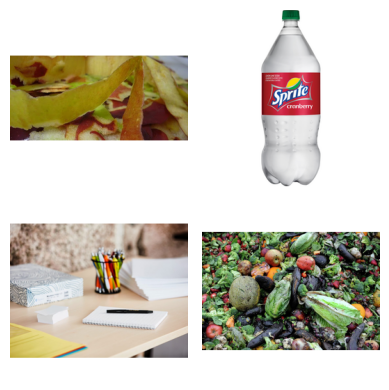

In [21]:
# Images before applying augmentation
visualize_images()

### RandomFlip Augmentation:

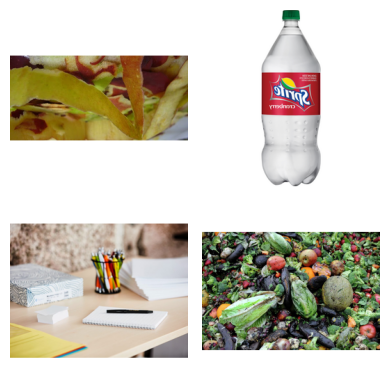

In [22]:
random_flip = keras_cv.layers.RandomFlip(
    mode = "horizontal_and_vertical"
)

augmenters = [random_flip]
visualize_images(augmentation = random_flip)

### RandomCropAndResize Augmentation:

The next augmentation we'll use is RandomCropAndResize. This operation selects a random subset of the image, then resizes it to the provided target size. By using this augmentation, we force our classifier to become spatially invariant. Additionally, this layer accepts an ```aspect_ratio_factor``` which can be used to distort the aspect ratio of the image. While this can improve model performance, it should be used with caution. It is very easy for an aspect ratio distortion to shift a sample too far from the original training set's data distribution. 


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

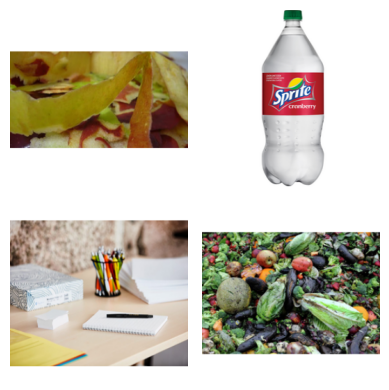

In [23]:
random_crop_and_resize = keras_cv.layers.RandomCropAndResize(
    target_size = (256, 256),
    crop_area_factor = (0.8, 1.0),
    aspect_ratio_factor = (0.9, 1.1),
)

augmenters += [random_crop_and_resize]
visualize_images(augmentation = random_crop_and_resize)

### RandomCutOut Augmentation:

This augmentation technique randomly cuts out rectangles from images and fill them.

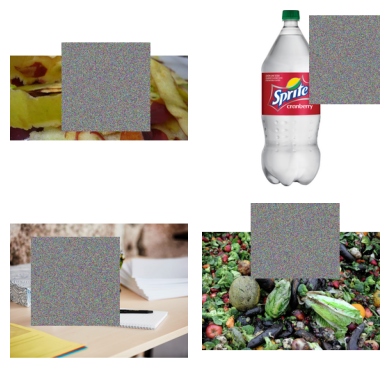

In [24]:
random_cutout = keras_cv.layers.RandomCutout(
    height_factor = (0.5, 0.5),
    width_factor = (0.5, 0.5),
    fill_mode = 'gaussian_noise'
)

augmenters += [random_cutout]
visualize_images(augmentation = random_cutout)

### RandAugmentation Augmentation:

```RandAugment``` is actually a set of 10 different augmentations: ```AutoContrast```, ```Equalize```, ```Solarize```, ```RandomColorJitter```, ```RandomContrast```, ```RandomBrightness```, ```ShearX```, ```ShearY```, ```TranslateX``` and ```TranslateY```. At inference time, ```num_augmentations``` augmenters are sampled for each image, and random magnitude factors are sampled for each. These augmentations are then applied sequentially.


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

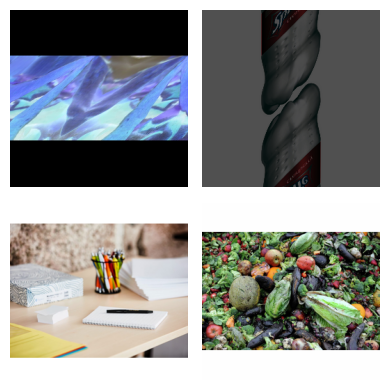

In [25]:
rand_augment = keras_cv.layers.RandAugment(
    value_range = (0, 255),
    augmentations_per_image = 5,
    magnitude = 0,
    magnitude_stddev = 1,
    rate = 10/11,
)

augmenters += [rand_augment]
visualize_images(augmentation = rand_augment)

### CutMix Augmentation:

While the random cutouts of the ```RandomCutOut``` layer tackles the problem reasonably well, it can cause the classifier to develop responses to borders between features and the pixel areas caused by the cutout.

```CutMix``` solves the same issue by using a more complex (and more effective) technique. Instead of replacing the cut-out areas with random noise, ```CutMix``` replaces these regions with regions of other images sampled from within your training set! Following this replacement, the image's classification label is updated to be a blend of the original and mixed image's class label.

**NOTE:** ```CutMix``` needs to modify both images and labels


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

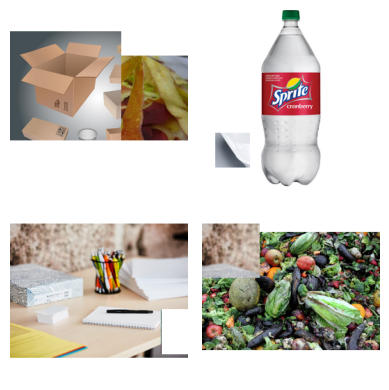

In [26]:
cut_mix = keras_cv.layers.CutMix()
inputs = {"images": image_batch, "labels": label_batch}
visualize_images(images = cut_mix(inputs)['images'])

### MixUp Augmentation:

```MixUp()``` works by sampling two images from a batch, then proceeding to literally blend together their pixel intensities as well as their classification labels.

**NOTE:** ```MixUp``` needs to modify both images and labels


[[source]](https://keras.io/guides/keras_cv/classification_with_keras_cv/)

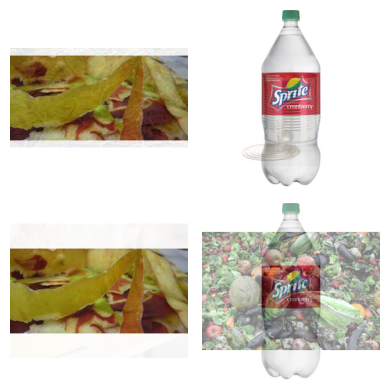

In [27]:
mix_up = keras_cv.layers.MixUp(0.5)
inputs = {"images": image_batch, "labels": label_batch}
visualize_images(images = mix_up(inputs)['images'])

**NOTE:** Instead of applying ```CutMix()``` and ```MixUp()``` to every image, we will apply either of them to each batch. We will do this using ```keras_cv.layers.RandomChoice()```.

In [28]:
cut_mix_or_mix_up = keras_cv.layers.RandomChoice(
    [cut_mix, mix_up], 
    batchwise = True
)
augmenters += [cut_mix_or_mix_up]

### Creating and applying image augmentation function:

In [29]:
def create_augmenter_fn(augmenters):
    def augmenter_fn(inputs):
        for augmenter in augmenters:
            inputs = augmenter(inputs)
        return inputs
    return augmenter_fn


augmenter_fn = create_augmenter_fn(augmenters)
train_data = train_data.map(augmenter_fn, num_parallel_calls=tf.data.AUTOTUNE)

### Visualizing the augmented images:

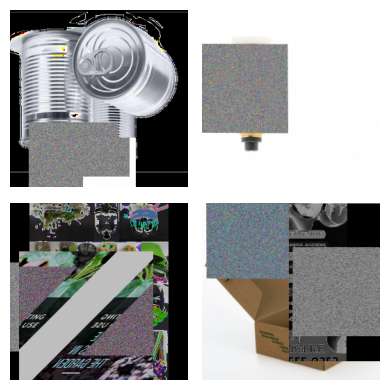

In [30]:
batch = next(iter(train_data.take(1)))
image_batch = batch["images"]
label_batch = batch["labels"]

visualize_images(images = image_batch)

In [31]:
def unpackage_dict(inputs):
    return inputs["images"], inputs["labels"]

train_data = train_data.map(unpackage_dict, num_parallel_calls=tf.data.AUTOTUNE)

---

# Model Building <a id="model-building"></a>:


We will fine tune the `EfficientNetV2_B2` model along with the pre-trained **imagenet** weights. This model is a variant of the **EfficientNetV2** family, known for its state-of-the-art performance in image classification tasks. Developed by **Google**, **EfficientNetV2** builds upon the original **EfficientNet** architecture, which introduced a novel compound scaling method to balance model depth, width, and resolution, achieving high accuracy with fewer parameters.

**EfficientNetV2** improves on this by focusing on faster training speeds and better accuracy, particularly on smaller datasets. It introduces a new scaling approach that optimizes both model size and training time, making it more suitable for practical applications. `EfficientNetV2_B2` is one of the intermediate models in the family, balancing size and accuracy. It has a relatively low number of parameters compared to larger variants, making it more efficient while still delivering high performance.

The model uses advanced building blocks such as Fused-MBConv layers, which combine depthwise convolutions and regular convolutions to improve efficiency. Additionally, **EfficientNetV2** incorporates progressive learning techniques, allowing it to scale effectively across datasets of varying sizes and complexities. Overall, `EfficientNetV2_B2` is an excellent choice for tasks requiring high accuracy with computational efficiency, making it ideal for applications like fruit and vegetable classification.

In [32]:
backbone = keras_cv.models.EfficientNetV2Backbone.from_preset(
    "efficientnetv2_b2_imagenet",
    load_weights=True,
)

model = keras_cv.models.ImageClassifier(
    backbone=backbone,
    num_classes=len(test_classes),
)

Attaching 'config.json' from model 'keras/efficientnetv2/keras/efficientnetv2_b2_imagenet/2' to your Kaggle notebook...
Attaching 'config.json' from model 'keras/efficientnetv2/keras/efficientnetv2_b2_imagenet/2' to your Kaggle notebook...
Attaching 'model.weights.h5' from model 'keras/efficientnetv2/keras/efficientnetv2_b2_imagenet/2' to your Kaggle notebook...


In [33]:
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.AdamW(1e-4),
    metrics=[
        'accuracy',
        keras.metrics.TopKCategoricalAccuracy(
            k=5, name="top_5_accuracy",
        ),
    ]
)

model.summary()

Model: "image_classifier"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficient_net_v2b2_backbone     │ (None, None, None,     │     8,769,374 │
│ (EfficientNetV2Backbone)        │ 1408)                  │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ avg_pool                        │ (None, 1408)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ predictions (Dense)             │ (None, 30)             │        42,270 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,811,644 (33.61 MB)

 Trainable params: 8,729,356 (33.30 MB)

 Non-trainable params: 82,288 (321.44 KB)

---

# Model Training <a id="model-training"></a>:

* We will setup a callback so that training stops if the `val_accuracy` does not increase by 0.005% for two consecutive epochs.

In [34]:
earlystopping = keras.callbacks.EarlyStopping(
    monitor = 'val_accuracy',
    patience = 20,
    mode = 'max',
    min_delta = 0.005,
    verbose = 1,
    restore_best_weights = True
)

In [35]:
history = model.fit(
    train_data,
    epochs = 2,
    validation_data = valid_data,
    callbacks = [earlystopping],
)

Epoch 1/2


I0000 00:00:1749374277.150916      80 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1749374277.286241      80 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 608ms/step - accuracy: 0.1637 - loss: 3.1951 - top_5_accuracy: 0.4092

W0000 00:00:1749374512.113214      80 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1749374521.514858      80 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


375/375 ━━━━━━━━━━━━━━━━━━━━ 388s 654ms/step - accuracy: 0.1640 - loss: 3.1943 - top_5_accuracy: 0.4096 - val_accuracy: 0.6633 - val_loss: 1.3616 - val_top_5_accuracy: 0.9393
Epoch 2/2
375/375 ━━━━━━━━━━━━━━━━━━━━ 218s 573ms/step - accuracy: 0.4372 - loss: 2.2942 - top_5_accuracy: 0.7583 - val_accuracy: 0.7327 - val_loss: 0.9053 - val_top_5_accuracy: 0.9720
Restoring model weights from the end of the best epoch: 2.


---

# Plotting the Model Accuracy and Model Loss <a id="plotting-the-model-accuracy-and-model-loss"></a>:

In [36]:
def plot_model_metric(metric):
    plt.figure(dpi=120)
    plt.plot(history.history[metric], label=f'train_{metric}')
    plt.plot(history.history[f'val_{metric}'], label=f'val_{metric}')
    plt.xlabel('Epoch')
    plt.ylabel(metric)
    plt.legend()
    plt.title(f'{metric} over Epochs')
    plt.show();

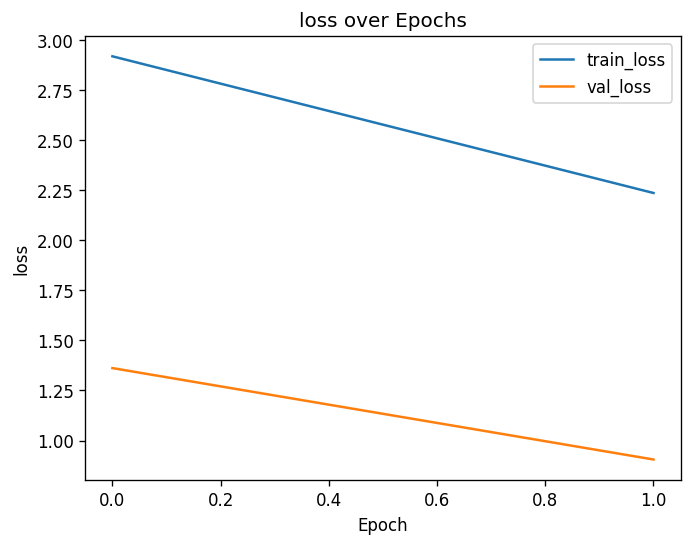

In [37]:
plot_model_metric('loss')

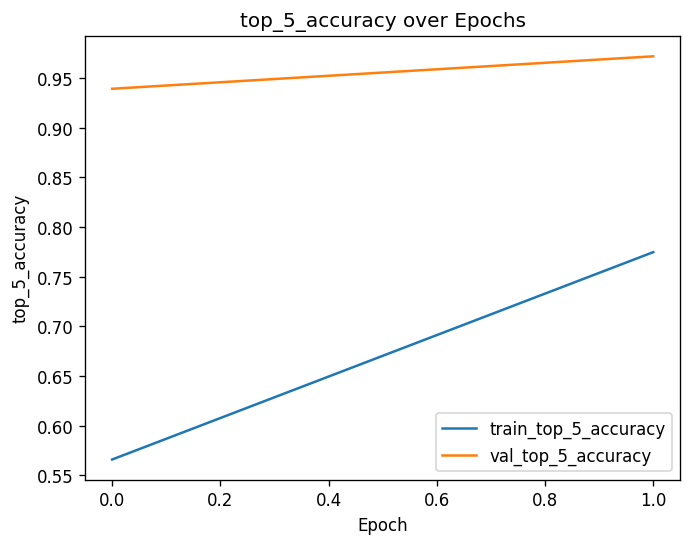

In [38]:
plot_model_metric('top_5_accuracy')

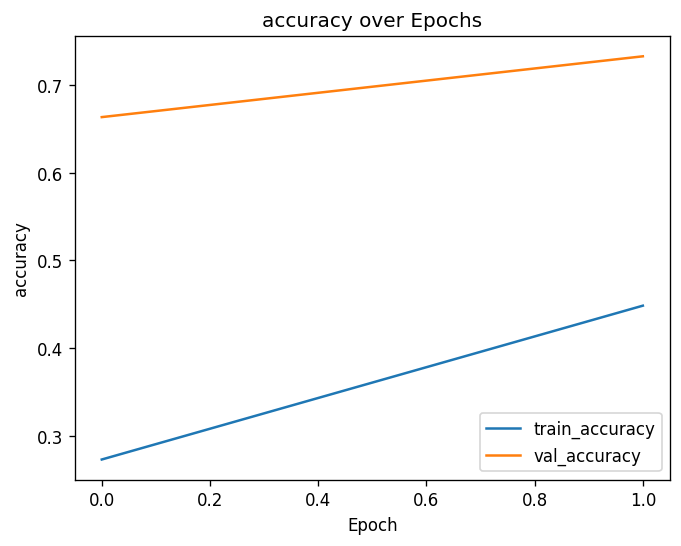

In [39]:
plot_model_metric('accuracy')

---

# Model Evaluation <a id="model-evaluation"></a>:

In [40]:
loss, accuracy, top_5_accuracy = model.evaluate(test_data, verbose=0)
template = "The model {0} on the test dataset is {1}."
print(template.format('loss', round(loss, 4)))
print(template.format('accuracy', f'{round(accuracy*100, 4)} %'))
print(template.format('top_5_accuracy', f'{round(top_5_accuracy*100, 4)} %'))

The model loss on the test dataset is 0.9226.
The model accuracy on the test dataset is 72.8 %.
The model top_5_accuracy on the test dataset is 96.7333 %.


As per the [data card](https://www.kaggle.com/datasets/alistairking/recyclable-and-household-waste-classification/data), the images in the dataset belongs to 6 broad categories of wastes:

1. **Plastic:** This category includes images of plastic water bottles, soda bottles, detergent bottles, shopping bags, trash bags, food containers, disposable cutlery, straws, and cup lids.

2. **Paper and Cardboard:** This category includes images of newspaper, office paper, magazines, cardboard boxes, and cardboard packaging.

3. **Glass:** This category includes images of beverage bottles, food jars, and cosmetic containers made of glass.

4. **Metal:** This category includes images of aluminum soda cans, aluminum food cans, steel food cans, and aerosol cans.

5. **Organic Waste:** This category includes images of food waste, such as fruit peels, vegetable scraps, eggshells, coffee grounds, and tea bags. 

6. **Textiles:** This category includes images of clothing and shoes.

So, let's evaluate the model in terms of its ability to classify wastes into the above 6 broad categories. In order to do so, we need to do the following things:
* First, we need to map the predictions of the test dataset to their respective class names.

* Secondly, we need to extract the ground truth labels from the test dataset and map them to their respective class names as well.

* Then, we will define a function that will take in the list of class names, map each class name to the broader waste category that it belongs to, and return a list consisting of just the broader waste categories.

In [41]:
# Getting the waste types from the predicted one-hot encoded labels
predictions = tf.argmax(model.predict(test_data, verbose=0), axis=1)
predicted_labels = [test_classes[i] for i in predictions]

W0000 00:00:1749374753.953859      80 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1749374761.880400      83 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


In [42]:
# Getting the ground truth waste types from the test dataset
true_labels = []

for images, labels in test_data:
    true_labels.append(labels)

true_labels = tf.argmax(tf.concat(true_labels, 0), axis=1)
true_labels = [test_classes[i] for i in true_labels]

In [43]:
# Function for mapping each type of waste to the broader category of wastes that it belongs to
def convert_to_waste_categories(labels):
    new_labels = labels.copy()
    
    for i in range(len(new_labels)):
        
        if any(x in new_labels[i] for x in ['plastic', 'styrofoam']):
            new_labels[i] = 'plastic or styrofoam'
            
        elif any(x in new_labels[i] for x in ['paper', 'card', 'magazine']):
            new_labels[i] = 'paper or cardboard'
        
        elif 'glass' in new_labels[i]:
            new_labels[i] = 'glass'
        
        elif any(x in new_labels[i] for x in ['aluminium', 'steel', 'can']):
            new_labels[i] = 'metal'
        
        elif any(x in new_labels[i] for x in ['food', 'vegetable', 'fruit', 'tea', 'coffee', 'egg']):
            new_labels[i] = 'organic'
        
        elif any(x in new_labels[i] for x in ['shoe', 'cloth']):
            new_labels[i] = 'textile'
    
    return new_labels

In [44]:
predicted_categories = convert_to_waste_categories(predicted_labels)
true_categories = convert_to_waste_categories(true_labels)

In [45]:
score = round(accuracy_score(true_categories, predicted_categories), 4)*100
print(f"The model accuracy in terms of accurately predicting the broader waste category is {score} %.")

The model accuracy in terms of accurately predicting the broader waste category is 86.8 %.


* We will now plot 9 random images from the test dataset along with their true and predcited labels
* If the predicted label matches the original label, the labels will be coloured in green, else, the labels will be coloured in red

In [46]:
# Function to display a grid of images with predictions and true labels
def display_images_with_predictions_and_true_labels(dataset, model, test_classes, num_images=9):
    plt.figure(figsize=(10, 10))

    # Take a batch from the dataset and select random images
    for images, labels in dataset.take(1):
        indices = np.random.choice(images.shape[0], num_images, replace=False)
        random_images = images.numpy()[indices]
        true_labels = labels.numpy()[indices]
        
        # Convert true labels to integer indices if they are one-hot encoded
        if len(true_labels.shape) > 1:
            true_labels = np.argmax(true_labels, axis=1)

        predictions = model.predict(random_images, verbose=0)
        predicted_labels = np.argmax(predictions, axis=1)

        for i in range(num_images):
            plt.subplot(3, 3, i + 1)
            plt.imshow(random_images[i].astype("uint8"))
            if true_labels[i] == predicted_labels[i]:
                color = 'green'
            else:
                color = 'red'
            plt.title(f"True: {test_classes[true_labels[i]]}\nPredicted: {test_classes[predicted_labels[i]]}",
                      color=color)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

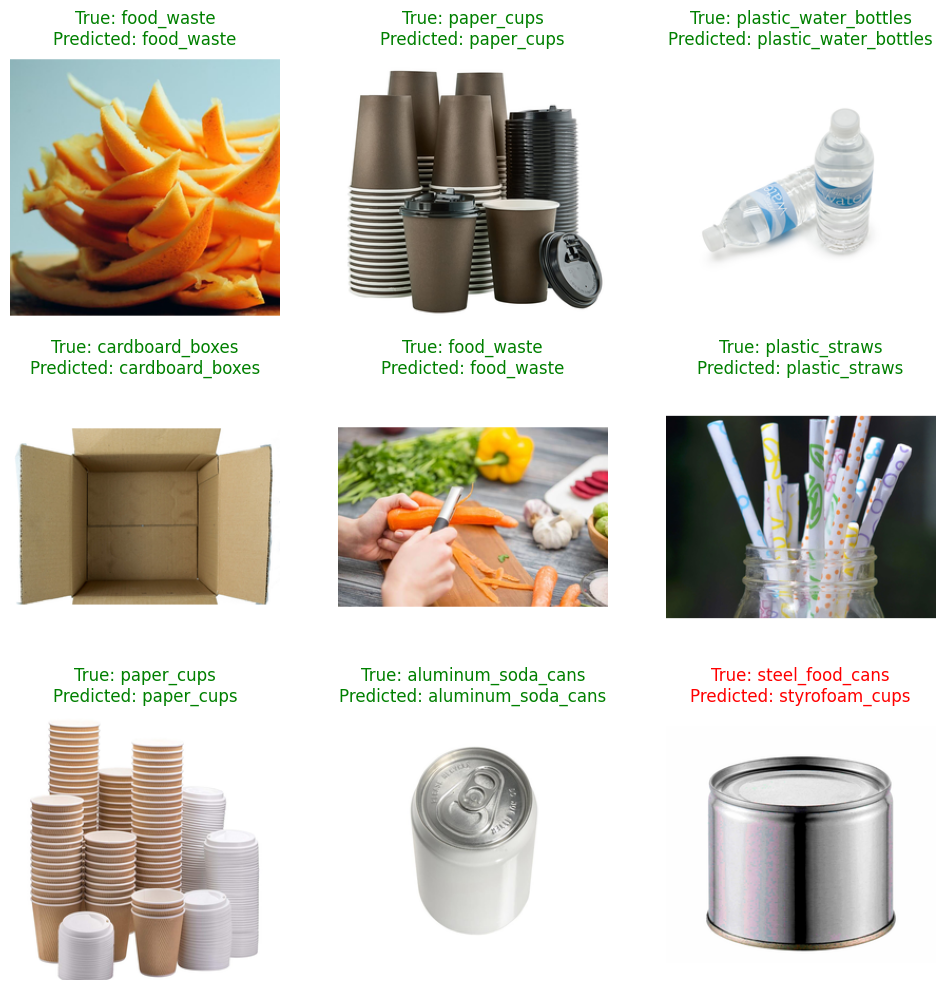

In [47]:
display_images_with_predictions_and_true_labels(test_data, model, test_classes)